# 1. Preliminary

## 1.1 Context

Date : Janvier 2024  
Auteur : Julien Caramanno

## 1.2 Problem Statement

Étude de faisabilité de la classification automatique d'articles :

Prétraitement des données texte et image.
Extraction de features à partir des images et des descriptions textuelles.
Réduction de dimensionnalité pour visualiser les produits sur un graphique 2D.
Analyse visuelle et mesure de similarité entre les catégories réelles et celles obtenues par clustering.
Analyse d'images :

Classification supervisée des images avec data augmentation.
Collecte de produits "champagne" via une API et extraction des données dans un fichier CSV.
Présentation des résultats :

Formalisation de la démarche et des résultats dans un support de présentation de 30 slides maximum au format PDF.

## 1.3 Requierements 

. pandas  
. numpy  
. matplotlib   
. seaborn  

In [1]:
package_list = ('pandas', 'numpy', 'seaborn', 'matplotlib')

In [2]:
txt = !python3 -m pip freeze
check = lambda i : any([(pack in i) for pack in package_list])
txt = [i for i in txt if check(i)]
txt

['matplotlib==3.8.2',
 'matplotlib-inline==0.1.6',
 'numpy==1.26.2',
 'pandas==2.1.4',
 'seaborn==0.13.0']

## 1.4 Importation des bibliothèques nécessaires

In [3]:
# Importation des bibliothèques de base pour la manipulation de données et la visualisation
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Importation des bibliothèques de scikit-learn pour le prétraitement, la réduction de dimension, le clustering et l'évaluation
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder

# Importation des bibliothèques NLTK pour le traitement du langage naturel
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Importation des bibliothèques Gensim pour les modèles de représentation de texte
from gensim.models import Word2Vec, Doc2Vec
from gensim.models.doc2vec import TaggedDocument

# Importation des bibliothèques Transformers pour l'utilisation des modèles pré-entraînés BERT
from transformers import BertTokenizer, BertModel

# Importation de PyTorch pour le calcul tensoriel et les réseaux de neurones
import torch
# Importation de TensorFlow Hub pour l'accès aux modèles pré-entraînés
import tensorflow_hub as hub

# Importation de bibliothèques supplémentaires pour le traitement des images et du texte
import string
import cv2

# Importation des bibliothèques pour le chargement et la préparation des images pour les modèles pré-entraînés
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input as preprocess_input_vgg
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input as preprocess_input_resnet

In [4]:
# Chargement des ressources NLTK pour le prétraitement du texte
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/juliencaramanno/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/juliencaramanno/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/juliencaramanno/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## 1.5 Lecture du fichier CSV

In [5]:
# Chargement des données
path = "./Source/"
filename = "flipkart_com-ecommerce_sample_1050.csv"
df = pd.read_csv(path + filename)

# 2. First Tour

## 2.1 Display

In [6]:
df.head(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."
5,893aa5ed55f7cff2eccea7758d7a86bd,2015-12-04 07:25:36 +0000,http://www.flipkart.com/maserati-time-r8851116...,Maserati Time R8851116001 Analog Watch - For ...,"[""Watches >> Wrist Watches >> Maserati Time Wr...",WATEAYAHJ8CUCAYM,24400.0,24400.0,893aa5ed55f7cff2eccea7758d7a86bd.jpg,False,Maserati Time R8851116001 Analog Watch - For ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
6,f355cc1ccb08bd0d283ed979b7ee7515,2015-12-04 07:25:36 +0000,http://www.flipkart.com/camerii-wm64-elegance-...,"Camerii WM64 Elegance Analog Watch - For Men,...","[""Watches >> Wrist Watches >> Camerii Wrist Wa...",WATE6Y6D2MZHWGBZ,1099.0,449.0,f355cc1ccb08bd0d283ed979b7ee7515.jpg,False,"Camerii WM64 Elegance Analog Watch - For Men,...",5,5,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
7,dd0e3470a7e6ed76fd69c2da27721041,2015-12-04 07:25:36 +0000,http://www.flipkart.com/t-star-uft-tsw-005-bk-...,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,"[""Watches >> Wrist Watches >> T STAR Wrist Wat...",WATECFFVGFZPAD3D,999.0,399.0,dd0e3470a7e6ed76fd69c2da27721041.jpg,False,T STAR UFT-TSW-005-BK-BR Analog Watch - For B...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
8,41384da51732c0b4df3de8f395714fbb,2015-12-04 07:25:36 +0000,http://www.flipkart.com/alfajr-wy16b-youth-dig...,"Alfajr WY16B Youth Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Alfajr Wrist Wat...",WATECHFU4QGFQEJG,5495.0,4995.0,41384da51732c0b4df3de8f395714fbb.jpg,False,"Alfajr WY16B Youth Digital Watc

In [7]:
df.tail(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1040,3b465b02720ef7c930cb2e065a8fc05d,2015-12-01 10:15:43 +0000,http://www.flipkart.com/elite-collection-mediu...,Elite Collection Medium Acrylic Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88KNANBFKHYM,1299.0,999.0,3b465b02720ef7c930cb2e065a8fc05d.jpg,False,Buy Elite Collection Medium Acrylic Sticker fo...,4,4,Elite Collection,"{""product_specification""=>[{""key""=>""Number of ..."
1041,b1644f47c7dfa58f8c06677f2a27ee09,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,Wallmantra Extra Large Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE9F5UFETEGPVY,1839.0,1216.0,b1644f47c7dfa58f8c06677f2a27ee09.jpg,False,Buy Wallmantra Extra Large Vinyl Stickers Stic...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1042,057836ecde71565f8ebdd576e41fdc96,2015-12-01 10:15:43 +0000,http://www.flipkart.com/walldesign-small-vinyl...,WallDesign Small Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE7KFJHGWC7RTY,1500.0,730.0,057836ecde71565f8ebdd576e41fdc96.jpg,False,Buy WallDesign Small Vinyl Sticker for Rs.730 ...,No rating available,No rating available,WallDesign,"{""product_specification""=>[{""key""=>""Number of ..."
1043,38782cce965307ddcdbedfcb7fa409c3,2015-12-01 10:15:43 +0000,http://www.flipkart.com/999store-medium-paper-...,999store Medium Paper Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2FRBYYC92E2C,999.0,599.0,38782cce965307ddcdbedfcb7fa409c3.jpg,False,Buy 999store Medium Paper Sticker for Rs.599 o...,No rating available,No rating available,999store,"{""product_specification""=>[{""key""=>""Sales Pack..."
1044,be0f39341d771aac57084970f1ed6425,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Stickers Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE9F5UYBHF4MXU,1429.0,1143.0,be0f39341d771aac57084970f1ed6425.jpg,False,Buy Wallmantra Medium Vinyl Stickers Sticker f...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Stick

In [8]:
df.sample(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
799,5188dd28a627807407d93549580afb74,2015-12-12 11:46:53 +0000,http://www.flipkart.com/rajrang-animal-cushion...,Rajrang Animal Cushions Cover,"[""Home Furnishing >> Cushions, Pillows & Cover...",CPCE8URTHJE6AK3N,2149.0,984.0,5188dd28a627807407d93549580afb74.jpg,False,Buy Rajrang Animal Cushions Cover at Rs. 984 a...,No rating available,No rating available,Rajrang,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
580,6f9c169adda9b562a841a9cf54b16f06,2016-01-07 05:50:25 +0000,http://www.flipkart.com/sonata-7085yl01-analog...,Sonata 7085YL01 Analog Watch - For Men,"[""Watches >> Wrist Watches >> Sonata Wrist Wat...",WATDT6GFNJN4WGYD,750.0,750.0,6f9c169adda9b562a841a9cf54b16f06.jpg,True,Sonata 7085YL01 Analog Watch - For Men - Buy ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
509,8fc61e0dae2460bc6e8f152283d20173,2016-01-07 05:50:25 +0000,http://www.flipkart.com/maxima-17321cmly-gold-...,Maxima 17321CMLY Gold Analog Watch - For Women,"[""Watches >> Wrist Watches >> Maxima Wrist Wat...",WATDYFQ559FZWRSQ,695.0,675.0,8fc61e0dae2460bc6e8f152283d20173.jpg,False,Maxima 17321CMLY Gold Analog Watch - For Wome...,4.5,4.5,NaN,"{""product_specification""=>[{""key""=>""Diameter"",..."
233,34d3b2b8d263294107a3ffc69b35ff8f,2015-12-01 12:40:44 +0000,http://www.flipkart.com/ethnic-story-royal-dur...,The Ethnic Story Royal Durban Showpiece - 30...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE8Q7P5XAGDZ4H,3700.0,1850.0,34d3b2b8d263294107a3ffc69b35ff8f.jpg,False,Buy The Ethnic Story Royal Durban Showpiece -...,No rating available,No rating available,The Ethnic Story,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
164,c8f42da0f9f695f07067676eae4135c8,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-colorful-ce...,Rockmantra Colorful Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> Rockmantr...",MUGEAGGKFYCFTBUJ,499.0,199.0,c8f42da0f9f695f07067676eae4135c8.jpg,False,Rockmantra Colorful Ceramic Mug (5.5 l)\r\n ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
882,a6c820b76bc29bbe2d85eecad3de03f8,2015-12-20 08:26:17 +0000,http://www.flipkart.com/mandhania-cotton-bath-...,Mandhania Cotton Bath Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWE5QUGZHGG8YZH,490.0,280.0,a6c820b76bc29bbe2d85eecad3de03f8.jpg,False,Buy Mandhania Cotton Bath Towel at Rs. 280 at ...,5,5,Mandhania,"{""product_specification""=>[{""key""=>""Machine Wa..."
955,1738ddb8f47f11ff0cb96fe6cad302c2,2016-01-01 13:15:34 +0000,http://www.flipkart.com/digilight-400-inch-red...,"Digilight 400 inch Red, Yellow Rice Lights","[""Home Decor & Festive Needs >> Decorative Lig...",RCLEYW4PHCUAWTGG,399.0,189.0,1738ddb8f47f11ff0cb96fe6cad302c2.jpg,False,"Buy Digilight 400 inch Red, Yellow Rice Lights...",No rating available,No rating available,Digilight,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
893,526cb1e7675adb39a1ea68f1f2a3fd59,2015-12-20 08:26:17 +0000,http://www.flipkart.com/durga-home-trendz-cott...,Durga Home Trendz Cotton Hand Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWEDGMRHGQZKRZR,599.0,250.0,526cb1e7675adb39a1ea68f1f2a3fd59.jpg,False,Durga Home Trendz Cotton Hand Towel (Hand Towe...,No rating available,No rating available,Durga Home Trendz,"{""product_specification""=>[{""key""=>""Machine Wa..."
453,e6b483fce5fd910afda67d97dc04e775,2015-12-03 21:49:05 +0000,http://www.flipkart.com/bed-bath-cotton-floral...,Bed & Bath Cotton Floral Double Bedsheet,"[""Home Furnishing >> Bed Linen >> Bedsheets""]",BDSE7WQ37UVSX7SK,4900.0,1960.0,e6b483fce5fd910afda67d97dc04e775.jpg,False,Bed & Bath Cotton Floral Double Bedsheet (1 Be...,No rating available,No rating available,Bed & Bath,"{""product_specificat

#### L'analyse montre que la variable 'product_name' suffit pour classer les produits, mais l'ajout de 'description' apporte plus de poids. Nous allons utiliser le premier niveau de 'product_category_tree' pour classer les produits.

## 2.2 Data Structure

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [10]:
df.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

<Axes: >

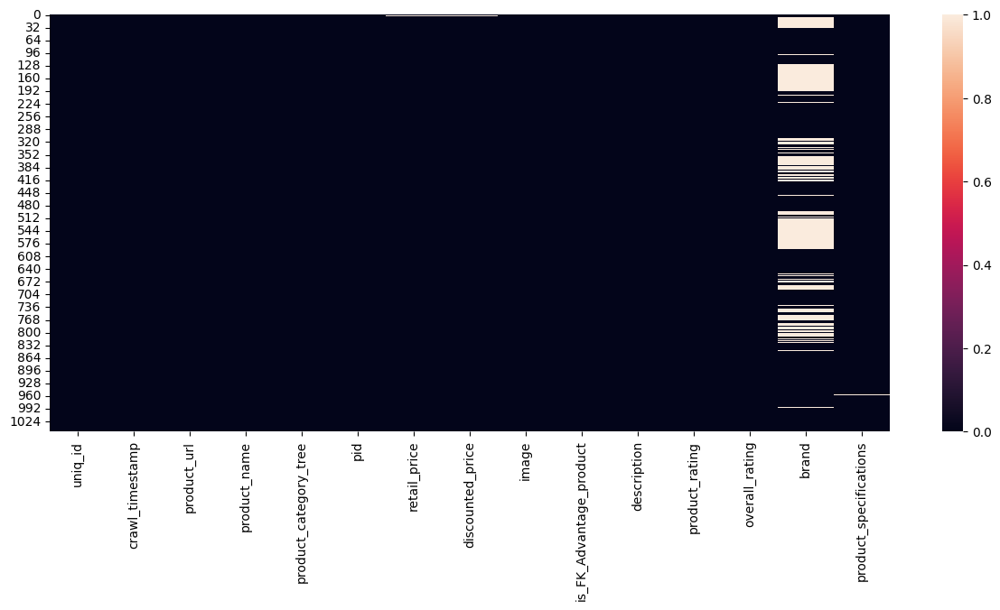

In [11]:
fig, ax = plt.subplots(1,1, figsize =(15, 6))
sns.heatmap(df.isna())

In [12]:
df.duplicated().sum()

0

In [13]:
df.duplicated(subset='description').sum()

0

In [14]:
for col in df.columns :
    n = df.duplicated(subset=col).sum()
    print(f'col : {col} -> duplicated : {n}')

col : uniq_id -> duplicated : 0
col : crawl_timestamp -> duplicated : 901
col : product_url -> duplicated : 0
col : product_name -> duplicated : 0
col : product_category_tree -> duplicated : 408
col : pid -> duplicated : 0
col : retail_price -> duplicated : 695
col : discounted_price -> duplicated : 625
col : image -> duplicated : 0
col : is_FK_Advantage_product -> duplicated : 1048
col : description -> duplicated : 0
col : product_rating -> duplicated : 1023
col : overall_rating -> duplicated : 1023
col : brand -> duplicated : 559
col : product_specifications -> duplicated : 65


#### Nous gérerons les données manquantes sans les supprimer, car il est essentiel de conserver 1050 données correspondant aux 1050 images.

# 3. Cleaning

In [15]:
# Filtrer les lignes avec des valeurs manquantes dans les colonnes spécifiées
missing_discounted_price_rows = df[df['discounted_price'].isnull()]
missing_product_specifications_rows = df[df['product_specifications'].isnull()]
missing_retail_price_rows = df[df['retail_price'].isnull()]

In [16]:
# Afficher les lignes avec des valeurs manquantes
print("Lignes avec des valeurs manquantes dans discounted_price:")
missing_discounted_price_rows

Lignes avec des valeurs manquantes dans discounted_price:


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."


In [17]:
print("\nLignes avec des valeurs manquantes dans product_specifications:")
missing_product_specifications_rows


Lignes avec des valeurs manquantes dans product_specifications:


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
957,e488005c7fb68747d3458c7d73760bae,2016-02-24 04:24:17 +0000,http://www.flipkart.com/nutcase-multicolor-col...,Nutcase Multicolor Column Floor Lamp,"[""Home Decor & Festive Needs >> Decorative Lig...",FIOEFUXPJQYZKDXZ,3299.0,1299.0,e488005c7fb68747d3458c7d73760bae.jpg,False,Key Features of Nutcase Multicolor Column Floo...,No rating available,No rating available,Nutcase,NaN


In [18]:
# Remplissage des valeurs manquantes
df["brand"].fillna("", inplace=True)
df["product_specifications"].fillna("", inplace=True)

In [19]:
print("Forme de la matrice des features : ", df.shape)

Forme de la matrice des features :  (1050, 15)


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    1050 non-null   object 
 14  product_specifications  

## 3.1 Features engineering

#### L'extraction de la catégorie principale révèle 7 catégories uniques au premier niveau.

In [21]:
# Exemple de la catégorie d'un produit
print(df["product_category_tree"][0])

["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]


In [22]:
# Extraction de la catégorie principale du produit
df["main_category"] = df["product_category_tree"].apply(lambda x: x.split(">>")[0].strip("[]\""))
print("Il y a {} catégories dans la profondeur 1".format(
     df["main_category"].nunique()
 ))

Il y a 7 catégories dans la profondeur 1


In [23]:
# Calculer la moyenne des colonnes 'retail_price' et 'discounted_price' par catégorie de produit
category_means = df.groupby('main_category')[['retail_price', 'discounted_price']].transform('mean')

# Remplir les valeurs manquantes uniquement avec les moyennes calculées
df['retail_price'].fillna(category_means['retail_price'], inplace=True)
df['discounted_price'].fillna(category_means['discounted_price'], inplace=True)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1050 non-null   float64
 7   discounted_price         1050 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    1050 non-null   object 
 14  product_specifications  

## 3.2 Visualisation Catégories

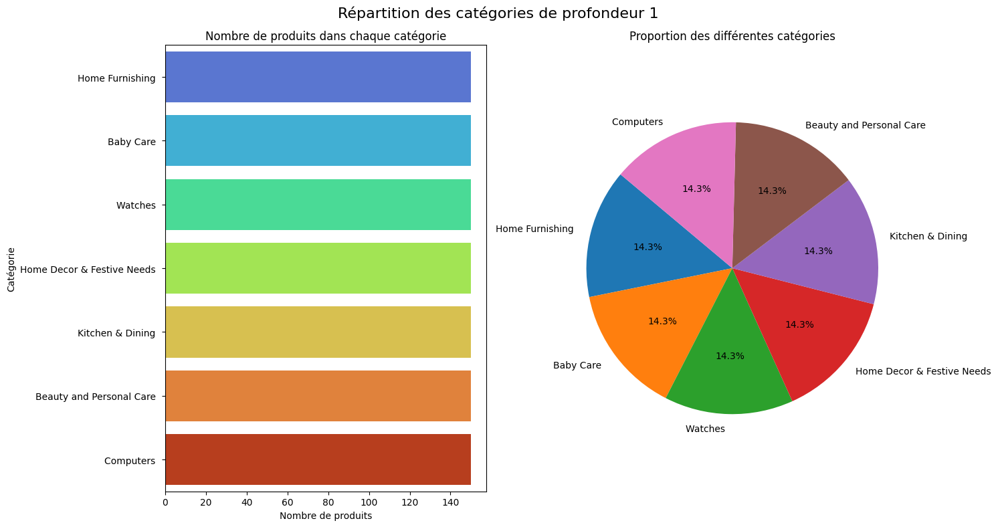

In [25]:
main_category = df["main_category"].value_counts()

fig = plt.figure(figsize=(15, 8))
plt.suptitle("Répartition des catégories de profondeur 1", fontsize=16)

plt.subplot(1, 2, 1)
plt.title("Nombre de produits dans chaque catégorie")
sns.barplot(x=main_category.values, y=main_category.index,
            orient="h", hue=main_category.index, palette="turbo",
            legend=False)

plt.xlabel("Nombre de produits")
plt.ylabel("Catégorie")

plt.subplot(1, 2, 2)
plt.title("Proportion des différentes catégories")
plt.pie(main_category, labels=main_category.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')

plt.tight_layout()
plt.show()

#### Les 7 catégories sont réparties équitablement, chacune comptant 150 produits.

# 4. Pré-Traitement

#### Débutons le prétraitement par la visualisation d'un produit, en mettant l'accent sur les variables les plus pertinentes.

In [26]:
print("La catégorie du produit est : {} \n".format(df["main_category"].iloc[0]))

print("La marque du produit est : {} \n".format(df["brand"].iloc[0]))

print("Le nom du produit est : {} \n".format(df["product_name"].iloc[0]))

print("Le descriptif du produit est : \n \n {}".format(df["description"].iloc[0]))

La catégorie du produit est : Home Furnishing  

La marque du produit est : Elegance 

Le nom du produit est : Elegance Polyester Multicolor Abstract Eyelet Door Curtain 

Le descriptif du produit est : 
 
 Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and

#### Nous concaténons effectivement 'description' et 'product_name' pour renforcer la performance des modèles NLP.

In [27]:
# Création descritpion avec concaténation de texte pour améliorer la performance des modèles de NLP 
df["description"] = df['description'] + ' ' + df['product_name']

####  Nous procédons au nettoyage des données en appliquant plusieurs filtres : conversion en minuscules, suppression de la ponctuation, tokenisation, élimination des mots contenant des chiffres, des mots vides et ceux de moins de trois lettres, puis lemmatisation pour réduire les mots à leur forme de base.

## 4.1 Nettoyage des données 

In [28]:
def clean_text(text):
    """
    Nettoie et prétraite un texte en effectuant plusieurs étapes de traitement du langage naturel.

    Cette fonction effectue les opérations suivantes :
    - Conversion du texte en minuscules pour uniformiser la casse.
    - Suppression de la ponctuation pour ne garder que les mots.
    - Tokenisation du texte pour le diviser en mots ou tokens individuels.
    - Suppression des mots vides (stop words) et des tokens contenant des chiffres pour éliminer le bruit.
    - Lemmatisation des tokens pour réduire les mots à leur forme de base, facilitant ainsi leur analyse.
    - Filtrage des mots pour ne garder que ceux ayant plus de 3 lettres, concentrant l'analyse sur les mots significatifs.

    Paramètres :
    - text (str) : Le texte à nettoyer et à prétraiter.

    Retourne :
    - str : Le texte nettoyé et prétraité, avec les mots significatifs en leur forme de base, séparés par des espaces.
    """
    # Convertir le texte en minuscules
    text = text.lower()
    
    # Supprimer la ponctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    
    # Tokenisation du texte
    tokens = word_tokenize(text)
    
    # Suppression des mots vides et des tokens contenant des chiffres
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words and not any(char.isdigit() for char in word)]
    
    # Lemmatisation des tokens pour obtenir la forme de base des mots
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in filtered_tokens]
    
    # Filtrage pour ne garder que les mots de plus de 3 lettres
    final_tokens = [word for word in lemmatized_tokens if len(word) > 3]
    
    # Retourner le texte nettoyé et prétraité
    return ' '.join(final_tokens)

In [29]:
# Application du prétraitement à la colonne description
df['cleaned_description'] = df['description'].apply(clean_text)

## 4.2 Visualisation du texte après traitement.

In [30]:
print("Le descriptif cleaned du produit est : \n \n {}".format(df["cleaned_description"].iloc[0]))

Le descriptif cleaned du produit est : 
 
 feature elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interiorsthis curtain made high quality polyester fabricit feature eyelet style stitch metal ringit make room environment romantic lovingthis curtain wrinkle anti shrinkage elegant apparancegive home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room right amount sunlightspecifications elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed door type eyelet model name abstract polyester door curtain model color multicolor dimension length number con

## 4.3 BoW ou TF-IDF

#### Suite au traitement des données, nous allons appliquer un modèle Bag of Words et tester TF-IDF pour comparer leur efficacité en capturant l'importance relative des mots dans les documents.

In [31]:
# Création du Bag of Words avec CountVectorizer
vectorizer = CountVectorizer()
X_bow = vectorizer.fit_transform(df['cleaned_description'])
# Affichage de la forme de la matrice des features
print("Forme de la matrice des features : ", X_bow.shape)

Forme de la matrice des features :  (1050, 4513)


In [32]:
X_bow_df = pd.DataFrame(X_bow.toarray())
X_bow_df.head(20)

,0,1,2,3,4,5,6,7,8,9,...,4503,4504,4505,4506,4507,4508,4509,4510,4511,4512
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
# TfidfVectorizer pour donner plus de poids aux mots moins fréquents
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(df['cleaned_description'])
# Affichage de la forme de la matrice des features
print("Forme de la matrice des features : ", X_tfidf.shape)

Forme de la matrice des features :  (1050, 4513)


In [34]:
tfidf_df = pd.DataFrame(X_tfidf.toarray())
tfidf_df.head(20)

,0,1,2,3,4,5,6,7,8,9,...,4503,4504,4505,4506,4507,4508,4509,4510,4511,4512
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 4.4 Réduction Dimension PCA

#### Nous procéderons à une Analyse en Composantes Principales (PCA) pour réduire la dimensionnalité et conserver les informations essentielles. Ensuite, nous utiliserons T-SNE pour une visualisation en deux dimensions et appliquerons KMeans pour regrouper les données, permettant ainsi d'identifier des regroupements naturels dans notre jeu de données.

In [35]:
# # Réduction de dimension avec PCA avec Bow
# pca = PCA(n_components=0.99)
# X_pca = pca.fit_transform(X_bow.toarray())

In [36]:
# Réduction de dimension avec PCA avec TF-IDF
pca = PCA(n_components=0.99)
X_pca = pca.fit_transform(X_tfidf.toarray())

# Affichage de la forme des features réduites
print("Forme des features réduites par PCA : ", X_pca.shape)

Forme des features réduites par PCA :  (1050, 784)


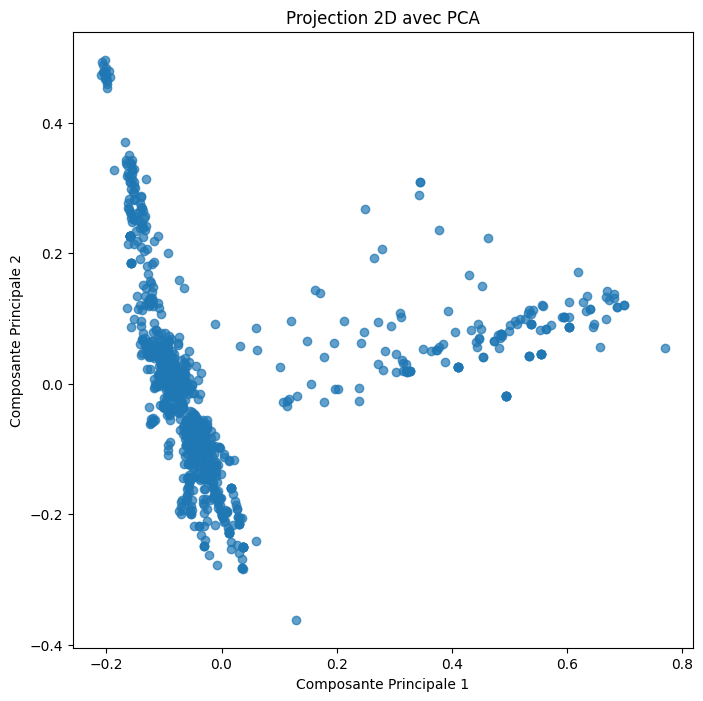

In [37]:
# Création d'une figure pour la projection 2D
plt.figure(figsize=(8, 8))

# Projection 2D avec PCA
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.7)
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.title('Projection 2D avec PCA')

plt.show()

# 5. Clustering et Evaluation ARI

## 5.1 Application t-SNE et KMeans sur PCA

#### Pour le clustering, nous conserverons la coloration selon la catégorie réelle, puis selon les clusters formés. La comparaison se fera ensuite à l'aide de l'Adjusted Rand Index (ARI) pour évaluer la similarité entre les regroupements réels et ceux prédits par le modèle.

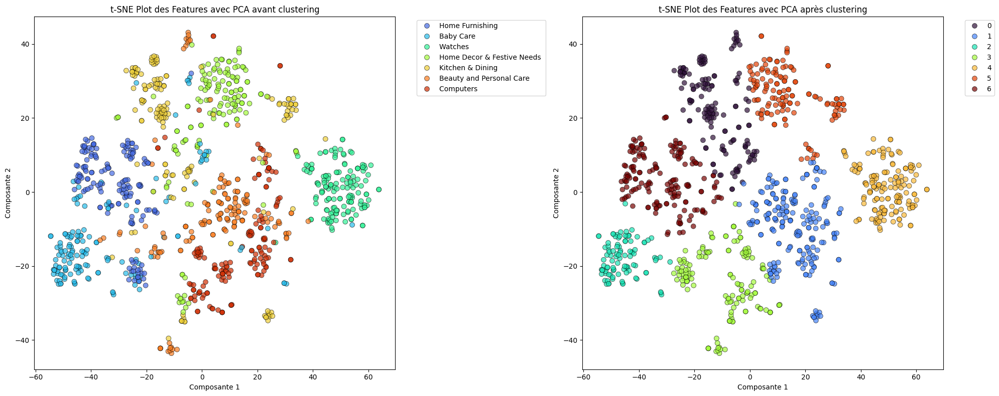

Adjusted Rand Score (ARI) :  0.47459445126817756


In [38]:
# Réduction de dimension à l'aide de t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_features = tsne.fit_transform(X_pca)

tsne_df = pd.DataFrame(tsne_features, columns=['Component 1', 'Component 2'])
tsne_df['main_category'] = df["main_category"]


fig, ax = plt.subplots(1, 2, figsize=(20, 8)) 

# Plot de la visualisation t-SNE avant le clustering
sns.scatterplot(data=tsne_df, x='Component 1', y='Component 2', hue='main_category', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[0])
ax[0].set_title('t-SNE Plot des Features avec PCA avant clustering')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Clustering k-means avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42, n_init=10)
kmeans_clusters = kmeans.fit_predict(tsne_features)

# Mise à jour de tsne_df pour inclure les clusters
tsne_df['cluster'] = kmeans_clusters

# Plot de la visualisation t-SNE après le clustering
sns.scatterplot(data=tsne_df, x='Component 1', y='Component 2', hue='cluster', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[1])
ax[1].set_title('t-SNE Plot des Features avec PCA après clustering')
ax[1].set_xlabel('Composante 1')
ax[1].set_ylabel('Composante 2')
ax[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Affichage de la figure avec les plots côte à côte
plt.tight_layout()
plt.show()

# Calcul et affichage de l'Adjusted Rand Score
ari_pca = adjusted_rand_score(labels_true= df["main_category"], labels_pred=kmeans_clusters)
print("Adjusted Rand Score (ARI) : ", ari_pca)

## 5.2 Application t-SNE et KMeans sur td-idf (sans PCA)

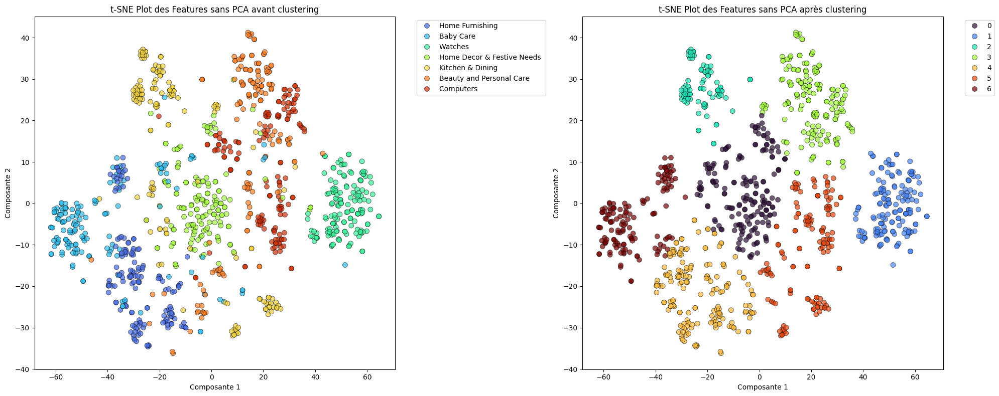

Adjusted Rand Score (ARI) :  0.5091181273777993


In [39]:
# Réduction de dimension à l'aide de t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_features = tsne.fit_transform(X_tfidf.toarray())

tsne_df = pd.DataFrame(tsne_features, columns=['Component 1', 'Component 2'])
tsne_df['main_category'] = df["main_category"]

fig, ax = plt.subplots(1, 2, figsize=(20, 8)) 

# Plot de la visualisation t-SNE avant le clustering
sns.scatterplot(data=tsne_df, x='Component 1', y='Component 2', hue='main_category', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[0])
ax[0].set_title('t-SNE Plot des Features sans PCA avant clustering')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Clustering k-means avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42, n_init=10)
kmeans_clusters = kmeans.fit_predict(tsne_features)

# Mise à jour de tsne_df pour inclure les clusters
tsne_df['cluster'] = kmeans_clusters

# Plot de la visualisation t-SNE après le clustering
sns.scatterplot(data=tsne_df, x='Component 1', y='Component 2', hue='cluster', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[1])
ax[1].set_title('t-SNE Plot des Features sans PCA après clustering')
ax[1].set_xlabel('Composante 1')
ax[1].set_ylabel('Composante 2')
ax[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Affichage de la figure avec les plots côte à côte
plt.tight_layout()
plt.show()

# Calcul et affichage de l'Adjusted Rand Score
ari = adjusted_rand_score(labels_true= df["main_category"], labels_pred=kmeans_clusters)
print("Adjusted Rand Score (ARI) : ", ari)

#### Les scores ARI de 0.47 et 0.50 sont relativement bons, indiquant une correspondance significative entre les clusters formés et les catégories réelles. Néanmoins, pour affiner notre compréhension du contexte sémantique et potentiellement améliorer la qualité du clustering, nous explorons également l'utilisation de modèles avancés de représentation de texte tels que Word2Vec, Doc2Vec, BERT, et USE.

## 5.3 Word2Vec et Doc2Vec avec Gensim

In [40]:
# Tokenisation des descriptions nettoyées pour Word2Vec
sentences = [nltk.word_tokenize(doc) for doc in df['cleaned_description']]
# Préparation des données pour Doc2Vec
tagged_data = [TaggedDocument(words=_d, tags=[str(i)]) for i, _d in enumerate(sentences)]

# Entraînement du modèle Word2Vec
model_w2v = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)

# Entraînement du modèle Doc2Vec
model_d2v = Doc2Vec(tagged_data, vector_size=100, window=5, min_count=1, epochs=10)

# Récupération des vecteurs pour chaque document
word_vectors = np.array([np.mean([model_w2v.wv[w] for w in words if w in model_w2v.wv], axis=0) for words in sentences])
doc_vectors = np.array([model_d2v.dv[str(i)] for i in range(len(sentences))])

## 5.3.1 Visualisation des Embeddings Word2Vec avec T-SNE et Calcul de l'ARI

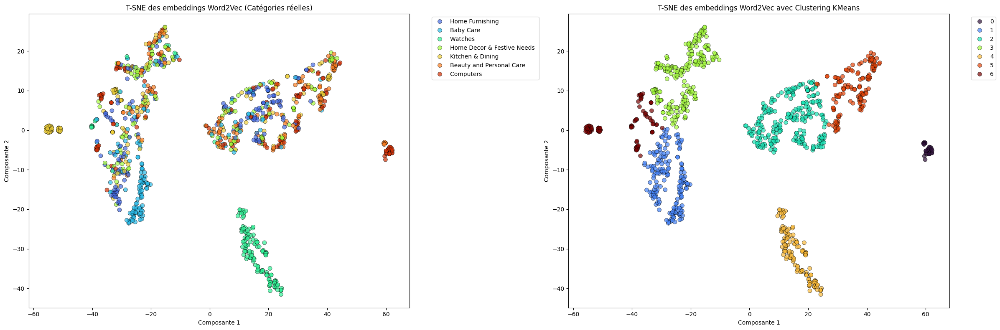

Adjusted Rand Index (ARI) pour Word2Vec embeddings: 0.20223747720073962


In [41]:
# Application de T-SNE pour réduire à 2 composantes pour la visualisation des embeddings Word2Vec
tsne_word2vec = TSNE(n_components=2, random_state=42)
X_tsne_word2vec = tsne_word2vec.fit_transform(word_vectors)

# Création d'un DataFrame pour faciliter la visualisation
tsne_w2v_df = pd.DataFrame(X_tsne_word2vec, columns=['Component 1', 'Component 2'])
tsne_w2v_df['main_category'] = df["main_category"]  # Vraies catégories

# Clustering avec KMeans sur les données réduites par T-SNE (Word2Vec)
kmeans_word2vec = KMeans(n_clusters=7, random_state=42, n_init=10)
clusters_word2vec = kmeans_word2vec.fit_predict(X_tsne_word2vec)
tsne_w2v_df['cluster'] = clusters_word2vec  # Clusters obtenus

# Préparation de la figure et des axes pour les plots côte à côte
fig, ax = plt.subplots(1, 2, figsize=(24, 8))  # 1 ligne, 2 colonnes

# Visualisation des vraies catégories
sns.scatterplot(data=tsne_w2v_df, x='Component 1', y='Component 2', hue='main_category', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[0])
ax[0].set_title('T-SNE des embeddings Word2Vec (Catégories réelles)')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Visualisation des clusters pour Word2Vec
sns.scatterplot(data=tsne_w2v_df, x='Component 1', y='Component 2', hue='cluster', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[1])
ax[1].set_title('T-SNE des embeddings Word2Vec avec Clustering KMeans')
ax[1].set_xlabel('Composante 1')
ax[1].set_ylabel('Composante 2')
ax[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Affichage de la figure avec les plots côte à côte
plt.tight_layout()
plt.show()

# Calcul et affichage de l'Adjusted Rand Score
ari_score_word2vec = adjusted_rand_score(labels_true= df["main_category"], labels_pred=clusters_word2vec)
print(f"Adjusted Rand Index (ARI) pour Word2Vec embeddings: {ari_score_word2vec}")


## 5.4 Visualisation des Embeddings Doc2Vec avec T-SNE et Calcul de l'ARI

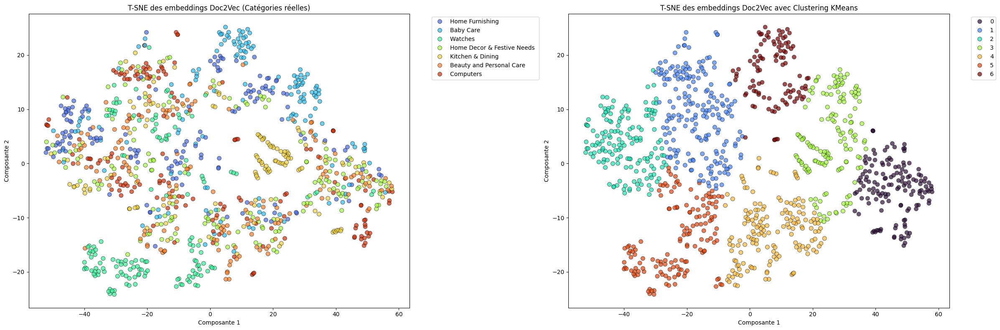

Adjusted Rand Index (ARI) pour Doc2Vec embeddings: 0.06219221932587356


In [42]:
# Application de T-SNE pour réduire à 2 composantes pour la visualisation des embeddings Doc2Vec
tsne_doc2vec = TSNE(n_components=2, random_state=42)
X_tsne_doc2vec = tsne_doc2vec.fit_transform(doc_vectors)

# Création d'un DataFrame pour faciliter la visualisation
tsne_d2v_df = pd.DataFrame(X_tsne_doc2vec, columns=['Component 1', 'Component 2'])
tsne_d2v_df['main_category'] = df["main_category"]  # Vraies catégories

# Clustering avec KMeans sur les données réduites par T-SNE (Doc2Vec)
kmeans_doc2vec = KMeans(n_clusters=7, random_state=42, n_init=10)
clusters_doc2vec = kmeans_doc2vec.fit_predict(X_tsne_doc2vec)
tsne_d2v_df['cluster'] = clusters_doc2vec  # Clusters obtenus

# Préparation de la figure et des axes pour les plots côte à côte
fig, ax = plt.subplots(1, 2, figsize=(24, 8))  # 1 ligne, 2 colonnes

# Visualisation des vraies catégories
sns.scatterplot(data=tsne_d2v_df, x='Component 1', y='Component 2', hue='main_category', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[0])
ax[0].set_title('T-SNE des embeddings Doc2Vec (Catégories réelles)')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Visualisation des clusters pour Doc2Vec
sns.scatterplot(data=tsne_d2v_df, x='Component 1', y='Component 2', hue='cluster', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[1])
ax[1].set_title('T-SNE des embeddings Doc2Vec avec Clustering KMeans')
ax[1].set_xlabel('Composante 1')
ax[1].set_ylabel('Composante 2')
ax[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Affichage de la figure avec les plots côte à côte
plt.tight_layout()
plt.show()

# Calcul et affichage de l'Adjusted Rand Score
ari_score_doc2vec = adjusted_rand_score(labels_true= df["main_category"], labels_pred=clusters_doc2vec)
print(f"Adjusted Rand Index (ARI) pour Doc2Vec embeddings: {ari_score_doc2vec}")

## 5.5 BERT avec Hugging Face Transformers

In [43]:
# Initialisation du tokenizer et du modèle BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Fonction pour extraire des embeddings BERT
def get_bert_embedding(sentence):
    # Tokenisation et préparation des inputs
    inputs = tokenizer(sentence, return_tensors="pt", padding=True, truncation=True, max_length=512)
    # Obtention des outputs du modèle
    outputs = model(**inputs)
    # Moyenne des embeddings sur la dernière couche pour obtenir un seul vecteur par input
    return outputs.last_hidden_state.mean(dim=1).detach().numpy()

# Extraction des embeddings BERT pour chaque description nettoyée
bert_embeddings = np.array([get_bert_embedding(sentence)[0] for sentence in df['cleaned_description']])

## 5.5.1 Visualisation avec T-SNE à partir des Embeddings BERT

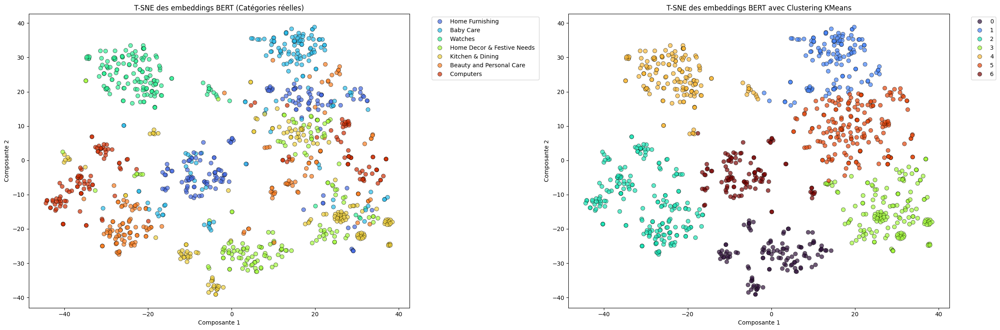

Adjusted Rand Index (ARI) pour BERT embeddings: 0.3290610117470701


In [44]:
# Application de T-SNE pour la réduction dimensionnelle des embeddings BERT
tsne_bert = TSNE(n_components=2, random_state=42)
X_tsne_bert = tsne_bert.fit_transform(bert_embeddings)

# Création d'un DataFrame pour faciliter la visualisation
tsne_bert_df = pd.DataFrame(X_tsne_bert, columns=['Component 1', 'Component 2'])
tsne_bert_df['main_category'] = df["main_category"]  # Vraies catégories

# Clustering avec KMeans sur les données réduites par T-SNE (BERT)
kmeans_bert = KMeans(n_clusters=7, random_state=42, n_init=10)
clusters_bert = kmeans_bert.fit_predict(X_tsne_bert)
tsne_bert_df['cluster'] = clusters_bert  # Clusters obtenus

# Préparation de la figure et des axes pour les plots côte à côte
fig, ax = plt.subplots(1, 2, figsize=(24, 8))  # 1 ligne, 2 colonnes

# Visualisation des vraies catégories
sns.scatterplot(data=tsne_bert_df, x='Component 1', y='Component 2', hue='main_category', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[0])
ax[0].set_title('T-SNE des embeddings BERT (Catégories réelles)')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Visualisation des clusters pour BERT
sns.scatterplot(data=tsne_bert_df, x='Component 1', y='Component 2', hue='cluster', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[1])
ax[1].set_title('T-SNE des embeddings BERT avec Clustering KMeans')
ax[1].set_xlabel('Composante 1')
ax[1].set_ylabel('Composante 2')
ax[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Affichage de la figure avec les plots côte à côte
plt.tight_layout()
plt.show()

# Calcul et affichage de l'Adjusted Rand Score
ari_score_bert = adjusted_rand_score(labels_true= df["main_category"], labels_pred=clusters_bert)
print(f"Adjusted Rand Index (ARI) pour BERT embeddings: {ari_score_bert}")

## 5.6 Universal Sentence Encoder (USE)

In [45]:
# Chargement du modèle USE
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Fonction pour obtenir des embeddings avec USE
def get_use_embedding(sentence):
    return embed([sentence])[0].numpy()

# Extraction des embeddings USE pour chaque description nettoyée
use_embeddings = np.array([get_use_embedding(sentence) for sentence in df['cleaned_description']])

## 5.6.1 Visualisation avec T-SNE à partir des Embeddings USE

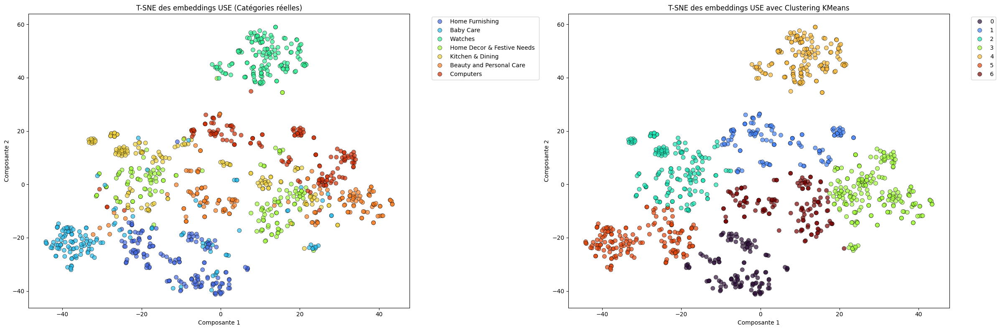

Adjusted Rand Index (ARI) pour USE embeddings: 0.4214282472685378


In [46]:
# Application de T-SNE pour la réduction dimensionnelle des embeddings USE
tsne_use = TSNE(n_components=2, random_state=42)
X_tsne_use = tsne_use.fit_transform(use_embeddings)

# Création d'un DataFrame pour faciliter la visualisation
tsne_use_df = pd.DataFrame(X_tsne_use, columns=['Component 1', 'Component 2'])
tsne_use_df['main_category'] = df["main_category"]  # Vraies catégories

# Clustering avec KMeans sur les données réduites par T-SNE (USE)
kmeans_use = KMeans(n_clusters=7, random_state=42, n_init=10)
clusters_use = kmeans_use.fit_predict(X_tsne_use)
tsne_use_df['cluster'] = clusters_use  # Clusters obtenus

# Préparation de la figure et des axes pour les plots côte à côte
fig, ax = plt.subplots(1, 2, figsize=(24, 8))  # 1 ligne, 2 colonnes

# Visualisation des vraies catégories
sns.scatterplot(data=tsne_use_df, x='Component 1', y='Component 2', hue='main_category', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[0])
ax[0].set_title('T-SNE des embeddings USE (Catégories réelles)')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
ax[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Visualisation des clusters pour USE
sns.scatterplot(data=tsne_use_df, x='Component 1', y='Component 2', hue='cluster', palette='turbo', legend='full', markers='o', edgecolor='black', s=50, alpha=0.7, ax=ax[1])
ax[1].set_title('T-SNE des embeddings USE avec Clustering KMeans')
ax[1].set_xlabel('Composante 1')
ax[1].set_ylabel('Composante 2')
ax[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Affichage de la figure avec les plots côte à côte
plt.tight_layout()
plt.show()

# Calcul et affichage de l'Adjusted Rand Score
ari_score_use = adjusted_rand_score(labels_true= df["main_category"], labels_pred=clusters_use)
print(f"Adjusted Rand Index (ARI) pour USE embeddings: {ari_score_use}")

#### Les scores ARI observés indiquent que l'approche combinant PCA et t-SNE est préférable, principalement parce que la PCA contribue à la réduction du bruit et améliore l'interprétabilité. Elle aide à purifier et simplifier les données avant leur traitement ultérieur. Cette constatation justifie le choix de la PCA suivie de t-SNE comme méthode principale pour identifier efficacement les clusters dans nos données.

In [47]:
print(f"Adjusted Rand Score (ARI) pour PCA puis TSNE: { ari_pca}")
print(f"Adjusted Rand Score (ARI) pour TSNE sans PCA: { ari}")
print(f"Adjusted Rand Index (ARI) pour Word2Vec embeddings: {ari_score_word2vec}")
print(f"Adjusted Rand Index (ARI) pour Doc2Vec embeddings: {ari_score_doc2vec}")
print(f"Adjusted Rand Index (ARI) pour BERT embeddings: {ari_score_bert}")
print(f"Adjusted Rand Index (ARI) pour USE embeddings: {ari_score_use}")

Adjusted Rand Score (ARI) pour PCA puis TSNE: 0.47459445126817756
Adjusted Rand Score (ARI) pour TSNE sans PCA: 0.5091181273777993
Adjusted Rand Index (ARI) pour Word2Vec embeddings: 0.20223747720073962
Adjusted Rand Index (ARI) pour Doc2Vec embeddings: 0.06219221932587356
Adjusted Rand Index (ARI) pour BERT embeddings: 0.3290610117470701
Adjusted Rand Index (ARI) pour USE embeddings: 0.4214282472685378


# 6. TRAITEMENT DES IMAGES

#### Nous débutons le traitement des images avec la méthode SIFT pour identifier et extraire les caractéristiques clés.

## 6.1 SIFT

In [49]:
# Chemin vers votre dossier contenant les images
image_path = './Source/Images/'

image_files = [file for file in os.listdir(image_path)]
print(f"Nombre d'images importées : {len(image_files)}")

Nombre d'images importées : 1050


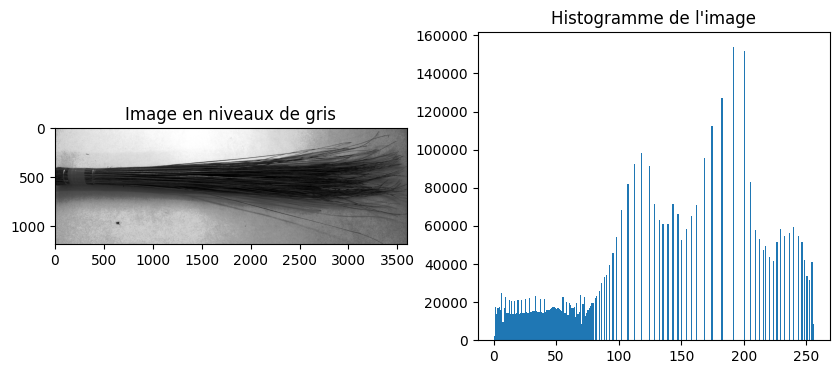

In [50]:
# Charger une image en niveaux de gris pour l'exemple initial
img_example = cv2.imread(image_path + image_files[0], 0)  # Convertir en niveaux de gris
img_example = cv2.equalizeHist(img_example)
# Affichage de l'image et de son histogramme
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(img_example, cmap='gray')
plt.title('Image en niveaux de gris')
plt.subplot(1, 2, 2)
plt.hist(img_example.ravel(), 256, [0,256])
plt.title('Histogramme de l\'image')
plt.show()

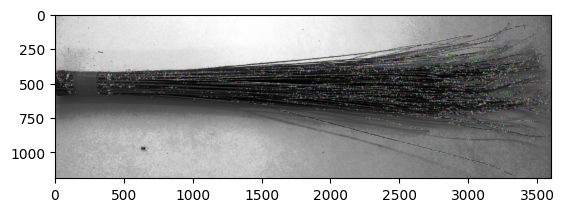

keypoints :  (8825, 128)


In [51]:
sift = cv2.SIFT_create()
kp, des = sift.detectAndCompute(img_example, None)
# Affichage des keypoints sur l'image
img_with_keypoints = cv2.drawKeypoints(img_example, kp, None)
plt.imshow(img_with_keypoints)
plt.show()
print("keypoints : ", des.shape)

#### Nous extrayons les keypoints SIFT de toutes les images, les regroupons en un seul ensemble de données, puis appliquons le clustering KMeans pour identifier 100 clusters distincts parmi ces descripteurs.

In [52]:
# Extraction des keypoints pour toutes les images
sift_keypoints = []
for img_name in image_files:
    img = cv2.imread(image_path + img_name, 0)
    img = cv2.equalizeHist(img)
    kp, des = sift.detectAndCompute(img, None)
    if des is not None:
        sift_keypoints.append(des)

# Concaténation de tous les keypoints
sift_keypoints_all = np.vstack(sift_keypoints)
print("Nombre total de keypoints : ", sift_keypoints_all.shape[0])

# Clustering des keypoints avec KMeans
kmeans = MiniBatchKMeans(n_clusters=100, random_state=42, n_init=10)
kmeans.fit(sift_keypoints_all)

Nombre total de keypoints :  9051350


MiniBatchKMeans(n_clusters=100, n_init=10, random_state=42)

#### Création des histogrammes pour chaque image et conversion en array pour les traitements suivants

In [53]:
# Création des histogrammes pour chaque image
hist_vectors = []
for des in sift_keypoints:
    hist, _ = np.histogram(kmeans.predict(des), bins=range(kmeans.n_clusters + 1), density=True)
    hist_vectors.append(hist)

# Conversion en array pour les traitements suivants
im_features = np.array(hist_vectors)

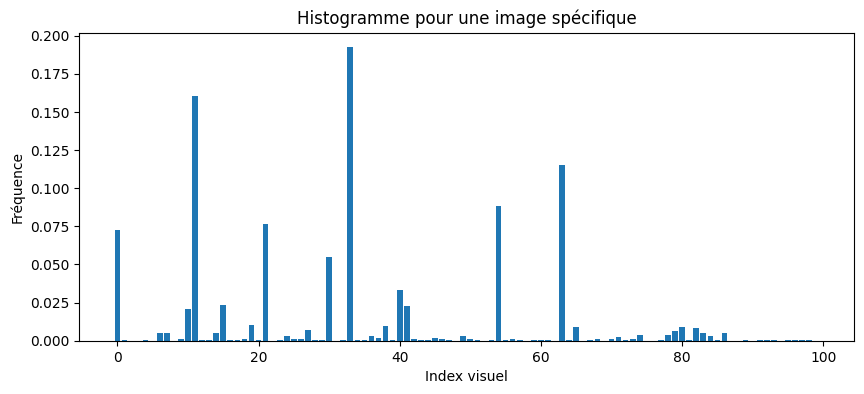

In [55]:
# Visualisation de la première image
index_image = 0
hist = hist_vectors[index_image]

# Visualisation de l'histogramme
plt.figure(figsize=(10, 4))
plt.bar(range(len(hist)), hist, align='center')
plt.title('Histogramme pour une image spécifique')
plt.xlabel('Index visuel')
plt.ylabel('Fréquence')
plt.show()

## 6.2 Visualisation 

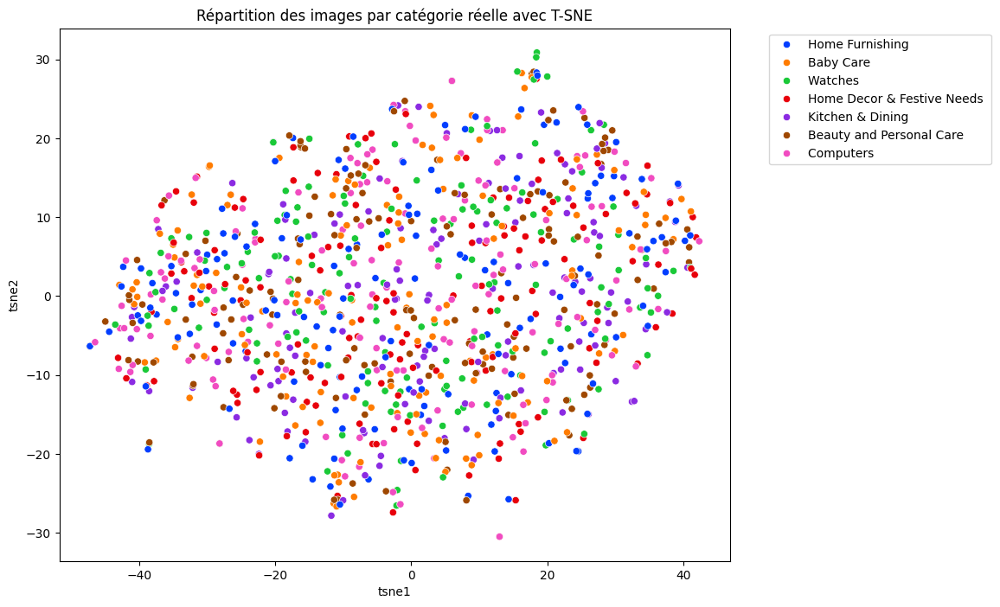

In [52]:
# Réduction de dimensionnalité
pca = PCA(n_components=0.99)
features_pca = pca.fit_transform(im_features)

tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(features_pca)

# Affichage T-SNE par catégories réelles
df_tsne = pd.DataFrame(features_tsne, columns=['tsne1', 'tsne2'])
df_tsne['category'] = df['main_category'].values

plt.figure(figsize=(10, 8))
sns.scatterplot(x='tsne1', y='tsne2', hue='category', data=df_tsne, palette='bright')
plt.title('Répartition des images par catégorie réelle avec T-SNE')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

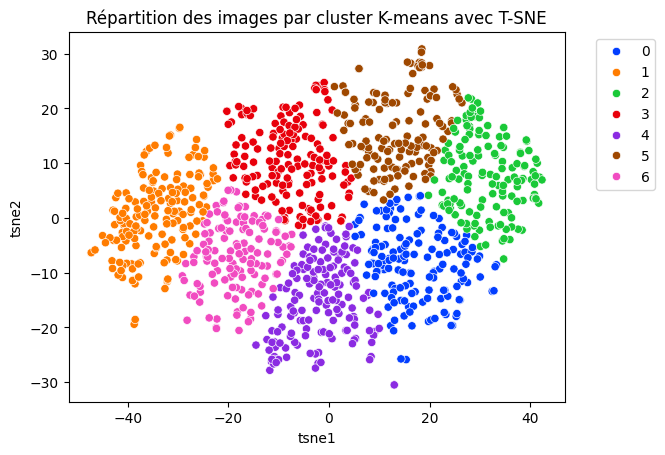

ARI : -0.0010029901394779223


In [53]:
# Clustering avec KMeans sur les données réduites
cls = KMeans(n_clusters=7, random_state=42, n_init=10)
cls.fit(features_tsne)

# Affichage des clusters
df_tsne['cluster'] = cls.labels_
sns.scatterplot(x='tsne1', y='tsne2', hue='cluster', data=df_tsne, palette='bright')
plt.title('Répartition des images par cluster K-means avec T-SNE')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Calcul de l'Adjusted Rand Index
ari_score = adjusted_rand_score(df['main_category'], cls.labels_)
print(f"ARI : {ari_score}")

#### L'Adjusted Rand Index (ARI) étant proche de 0, cela suggère une faible correspondance entre les clusters formés et les catégories réelles ; nous allons donc explorer l'utilisation des réseaux de neurones convolutifs (CNN) pour améliorer nos résultats.

# 7. CNN TRANSFERT 

In [54]:
Image.MAX_IMAGE_PIXELS = None

In [55]:
# Préparation des données d'images
path_images = './Source/Images/'
df_image = df[["image", "main_category"]].copy()
df_image['image'] = df_image['image'].apply(lambda nom_img: os.path.join(path_images, nom_img))

#### Nous utilisons un modèle de deep learning pré-entraîné, tel que VGG16 ou ResNet50, pour extraire des caractéristiques visuelles avancées des images en exploitant ses couches profondes. Après extraction, nous réduisons la dimensionnalité via PCA et t-SNE, puis regroupons les images avec KMeans, utilisant ces caractéristiques profondes pour identifier des clusters d'images similaires.

## 7.1 Définitions

In [56]:
# Fonction générique pour extraire les caractéristiques
def extraire_caracteristiques(model, preprocess_input, image_paths):
    """
    Extrait les caractéristiques d'images à l'aide d'un modèle pré-entraîné.

    Paramètres :
    - model : Le modèle de deep learning utilisé pour l'extraction de caractéristiques.
    - preprocess_input : La fonction de prétraitement spécifique au modèle pour préparer les images.
    - image_paths : Une liste de chemins vers les images dont il faut extraire les caractéristiques.

    Retourne :
    - Un tableau numpy contenant les caractéristiques extraites de toutes les images.
    """
    features = []
    for path_img in image_paths:
        image = load_img(path_img, target_size=(224, 224))
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)
        image = preprocess_input(image)
        features.append(model.predict(image))
    return np.vstack(features)

In [57]:
# Fonction pour la réduction de dimension et le clustering
def process_features(features, n_clusters):
    """
    Réduit la dimensionnalité des caractéristiques extraites et applique le clustering KMeans.

    Paramètres :
    - features : Tableau numpy des caractéristiques à traiter.
    - n_clusters : Le nombre de clusters à former.

    Retourne :
    - Un tuple contenant le tableau des caractéristiques après réduction de dimension et les étiquettes de cluster correspondantes.
    """
    pca = PCA(n_components=0.99)
    features_pca = pca.fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42)
    features_tsne = tsne.fit_transform(features_pca)
    kmeans = KMeans(n_clusters=n_clusters, n_init=100, random_state=42)
    kmeans.fit(features_tsne)
    return features_tsne, kmeans.labels_

In [58]:
# Fonction de visualisation unifiée
def visualiser(X, y_true, labels, label_to_category, title_prefix):
    """
    Visualise la répartition des données avant et après le clustering.

    Paramètres :
    - X : Les données de caractéristiques réduites à deux dimensions pour la visualisation.
    - y_true : Les étiquettes réelles des données.
    - labels : Les étiquettes de cluster obtenues après le clustering.
    - label_to_category : Un dictionnaire mappant les étiquettes à des noms de catégories pour la légende.
    - title_prefix : Un préfixe pour le titre des graphiques.

    Affiche deux graphiques : un pour la répartition originale des données et un autre pour la répartition après clustering.
    """
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    for ax, title, y in zip(axs, ['Avant Clustering', 'Après Clustering'], [y_true, labels]):
        scatter = ax.scatter(X[:, 0], X[:, 1], c=y, cmap='Set1')
        legend_labels = [label_to_category[label] for label in np.unique(y)]
        ax.legend(handles=scatter.legend_elements()[0], labels=legend_labels, title="Catégories")
        ax.set_title(f'{title_prefix} {title}')
    plt.suptitle(f'Comparaison avant et après clustering pour {title_prefix}')
    plt.show()

In [59]:
# Fonction pour calculer et afficher l'ARI
def calculer_et_afficher_ari(y_true, labels, title):
    """
    Calcule et affiche l'Adjusted Rand Index (ARI) pour évaluer la qualité du clustering.

    Paramètres :
    - y_true : Les étiquettes réelles des données.
    - labels : Les étiquettes de cluster obtenues après le clustering.
    - title : Le titre pour identifier les résultats affichés.

    Affiche l'ARI, une mesure de similarité entre les étiquettes réelles et les étiquettes de cluster.
    """
    ari = adjusted_rand_score(y_true, labels)
    print(f"ARI pour {title} :", ari)

In [60]:
# Encodage des catégories
le = LabelEncoder()
df['label_category'] = le.fit_transform(df['main_category'])
n_clusters = len(df['main_category'].unique())

In [61]:
# Mise à jour du dictionnaire pour la légende
label_to_category = {i: category for i, category in enumerate(le.classes_)}

## 7.2 Model VGG16

In [62]:
# Modèle vgg16
vgg16_model = VGG16(include_top=False, pooling='avg')

In [63]:
# Extraction des caractéristiques
vgg_features = extraire_caracteristiques(vgg16_model, preprocess_input_vgg, df_image['image'])

1/1 [==============================] - 0s 127ms/step


In [75]:
# Processus pour VGG16
tsne_vgg, labels_vgg = process_features(vgg_features, n_clusters)

ARI pour VGG16 : 0.3697186862843992


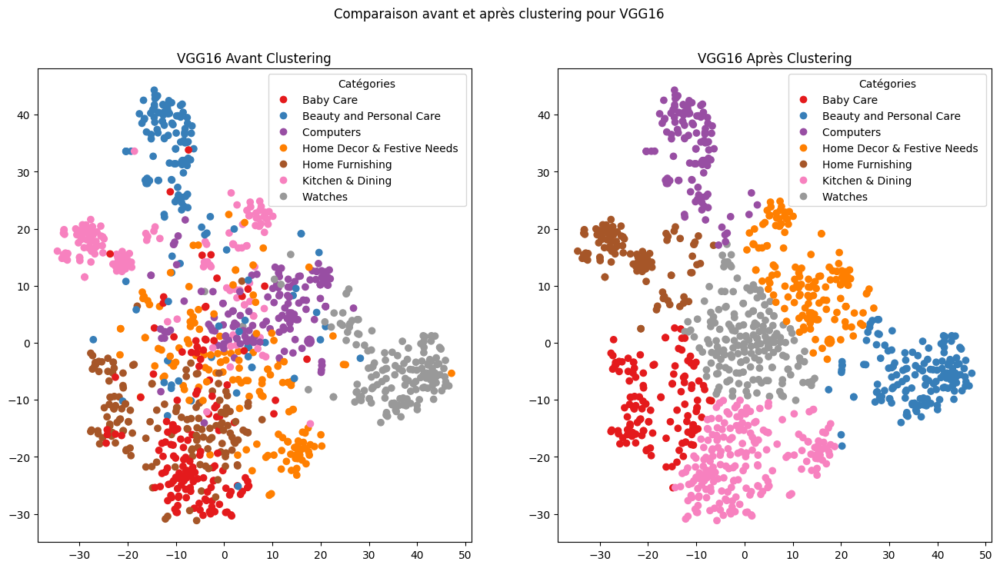

In [76]:
# Visualisations
calculer_et_afficher_ari(df['label_category'].values, labels_vgg, "VGG16")
visualiser(tsne_vgg, df['label_category'].values, labels_vgg, label_to_category, "VGG16")

## 7.3 Modèle resnet50

In [66]:
# Modèle resnet50
resnet50_model = ResNet50(include_top=False, pooling='avg')

In [67]:
# Extraction des caractéristiques
resnet_features = extraire_caracteristiques(resnet50_model, preprocess_input_resnet, df_image['image'])

1/1 [==============================] - 0s 50ms/step


In [77]:
# Processus pour ResNet50
tsne_resnet, labels_resnet = process_features(resnet_features, n_clusters)

ARI pour ResNet50 : 0.5044915861770823


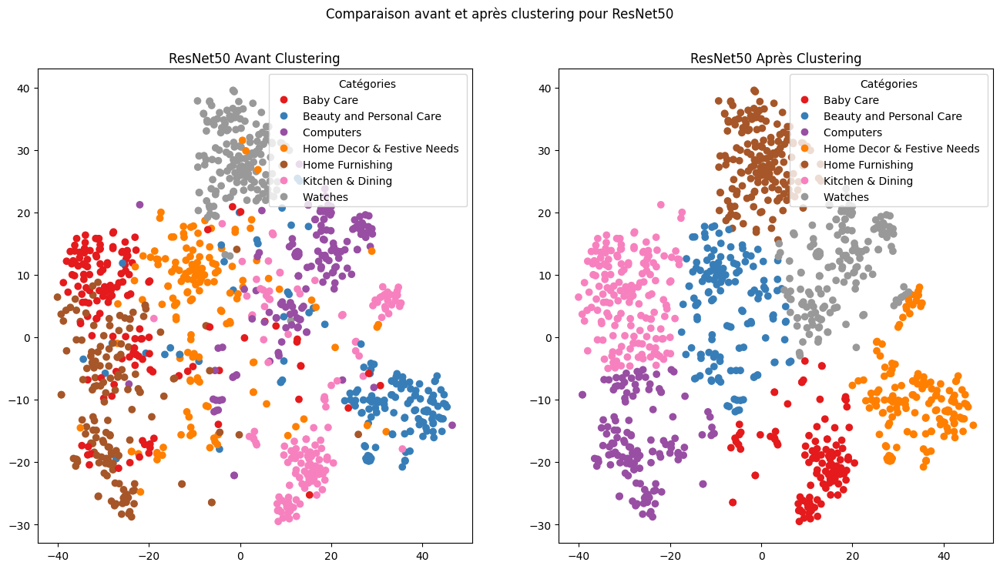

In [78]:
# Visualisations
calculer_et_afficher_ari(df['label_category'].values, labels_resnet, "ResNet50")
visualiser(tsne_resnet, df['label_category'].values, labels_resnet, label_to_category, "ResNet50")

#### Les résultats ARI, avec 0.37 pour VGG16 et 0.50 pour ResNet50, sont également relativement bons, confirmant la faisabilité d'une automatisation efficace. En combinant ces analyses d'images avec l'analyse de texte, nous pourrions obtenir des insights encore plus pertinents.

## 7.4 Visualisation des Images Regroupées par Cluster

In [72]:
def afficher_images_par_cluster(image_paths, labels, n_images=5):
    """
    Affiche un échantillon d'images pour chaque cluster avec des titres plus grands et centrés.

    :param image_paths: Liste des chemins vers les images.
    :param labels: Étiquettes de cluster pour chaque image.
    :param n_images: Nombre d'images à afficher par cluster.
    """
    # Regroupe les chemins d'images par étiquette de cluster
    clusters = {}
    for path, label in zip(image_paths, labels):
        if label not in clusters:
            clusters[label] = []
        clusters[label].append(path)
    
    # Nombre de clusters
    n_clusters = len(clusters)
    
    # Crée une figure pour les affichages
    fig, axs = plt.subplots(n_clusters, n_images, figsize=(n_images * 4, n_clusters * 4), squeeze=False)
    
    for label, paths in clusters.items():
        selected_images = paths[:n_images]
        for img_index, img_path in enumerate(selected_images):
            img = Image.open(img_path)
            ax = axs[label, img_index]
            ax.imshow(img)
            ax.axis('off')
            if img_index == 0:
                ax.set_title(f'Cluster {label}', fontsize=20, pad=20, ha='center')
    
    plt.tight_layout()
    plt.show()

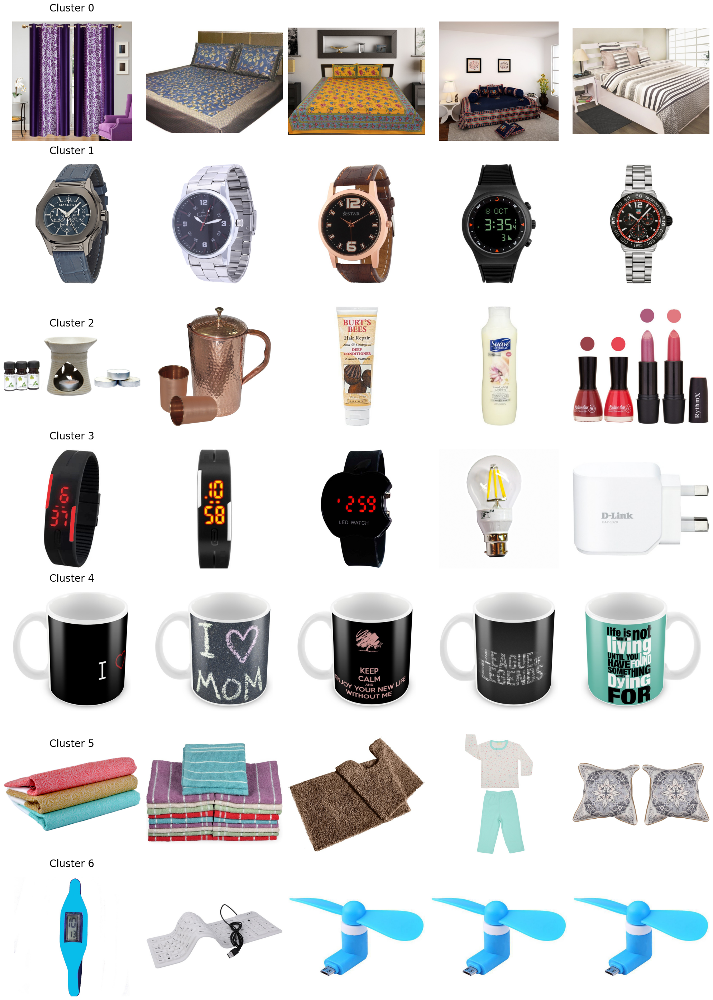

In [73]:
# Pour VGG16
afficher_images_par_cluster(df_image['image'].tolist(), labels_vgg, n_images=5)

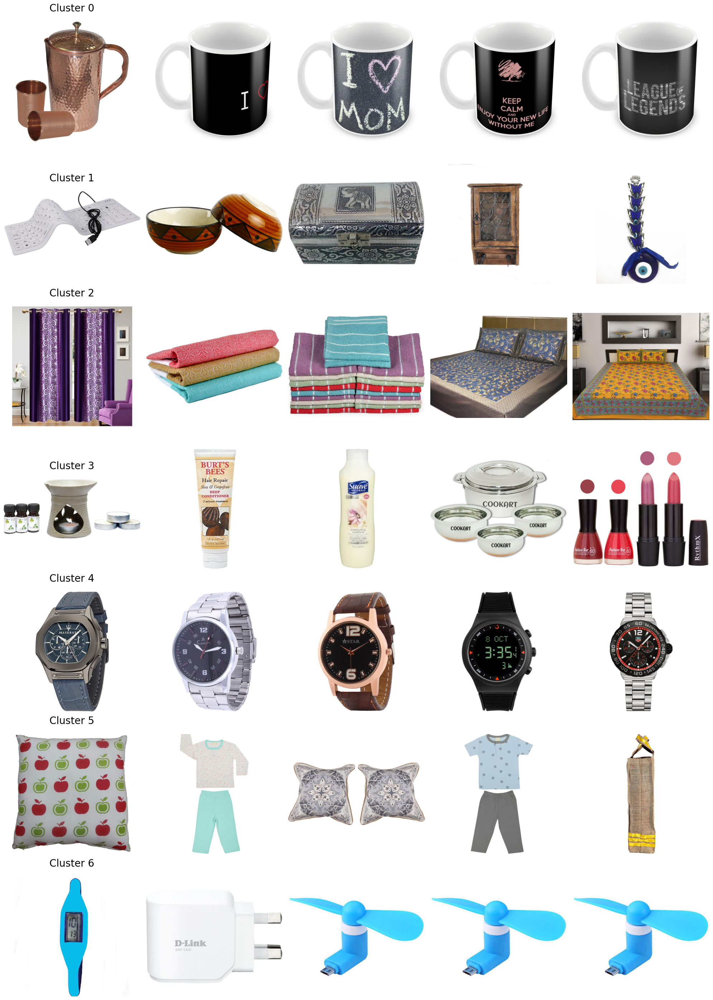

In [74]:
# Pour ResNet50
afficher_images_par_cluster(df_image['image'].tolist(), labels_resnet, n_images=5)